# CLIP

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torch.nn import functional as F
from einops import rearrange, repeat
from tqdm import tqdm
import torchvision.models as models
import wandb
import clip
from PIL import Image
import os
from pathlib import Path
from PIL import Image
import time
import copy
import subprocess

## Loading models

In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [31]:
resnet_imagenet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
resnet_clip, preprocess = clip.load("RN50", device=device)
resnet_clip = resnet_clip.visual

print(resnet_imagenet)
print(resnet_clip) 

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Difference in Visual Encoders:

- CLIP's RN50 replaces the standard ResNet inital layers with three 3x3 convolutions improving performance on small objects
- CLIP's RN50 uses attention pooling instead of the standard global average pooling which allows the model to focus on more relevant parts of the image.
- CLIP's RN50 uses a different normalization layer (LayerNorm) instead of the standard BatchNorm which is more robust to different batch sizes and improves performance on small datasets. 

## Setup data

#### Hierarchy in ImageNet

- ImageNet uses the WordNet hierarchy, which is a large lexical database of English.
- WordNet groups nouns into sets of cognitive synonyms (synsets), each representing a distinct concept.
- Each synset is associated with a unique identifier (ID) and contains a list of words that are synonymous with the concept.
- The hierarchy is organized into a tree structure, where each synset can have multiple parent and child synsets.
- The root of the hierarchy is the synset "entity" (ID: 0), which represents the most general concept.

### Synset

- A synset is a set of synonyms that share a common meaning or concept in WordNet. 
- Each synset is represented by a unique identifier (ID), a definition, and a list of words that are synonymous with the concept.

### Grouping based on synsets

- Yes, grouping based on synsets can lead to problems for visual recognition tasks.
- It could cause models to confuse visually similar objects that belong to different synsets or to misclassify objects that belong to the same synset but have different visual appearances.
- This is because the synsets are based on semantic relationships rather than visual similarities.

### Differences we can see in images with objects corresponding to same synset

- The images of objects that belong to the same synset can vary significantly in appearance, color, shape, and texture.
- For example, the synset "dog" (ID: 1) includes images of different dog breeds, which can have vastly different appearances.
- Additionally, the images may be taken in different environments, lighting conditions, and angles, further contributing to the visual diversity within the same synset.
- The images may also contain different backgrounds, occlusions, and other factors that can affect the visual representation of the object.
- This variability can make it challenging for models to learn robust features that generalize well across different instances of the same synset.

## Datasets

In [32]:
# all png files in the subtree of the current directory
def find_png_files(path):
    return [str(p) for p in Path(path).rglob("*.JPEG")]

imagenet_train_file_paths = find_png_files("data/imagenet-mini/train")

In [33]:
# ImageNet class names
imagenet_classes_url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
import urllib.request

with urllib.request.urlopen(imagenet_classes_url) as f:
    imagenet_labels = [line.decode('utf-8').strip() for line in f.readlines()]
print(imagenet_labels) 

text_prompts = [f"a photo of a {label}" for label in imagenet_labels]
text_tokens = clip.tokenize(text_prompts).to(device)

clip_model, preprocess = clip.load("RN50", device=device)
clip_model.eval()

with torch.no_grad():
    text_features = clip_model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'rock python', 'Indian cobra', 'green mamba', 'sea snake', 'horned viper', 'diamondback', 

In [34]:
synset_class_names = os.listdir("data/imagenet-mini/train")
synset_class_names.sort()

synset_data = {}
for i in range(1000):
    synset_data[synset_class_names[i]] = imagenet_labels[i]
print(synset_data)

{'n01440764': 'tench', 'n01443537': 'goldfish', 'n01484850': 'great white shark', 'n01491361': 'tiger shark', 'n01494475': 'hammerhead', 'n01496331': 'electric ray', 'n01498041': 'stingray', 'n01514668': 'cock', 'n01514859': 'hen', 'n01518878': 'ostrich', 'n01530575': 'brambling', 'n01531178': 'goldfinch', 'n01532829': 'house finch', 'n01534433': 'junco', 'n01537544': 'indigo bunting', 'n01558993': 'robin', 'n01560419': 'bulbul', 'n01580077': 'jay', 'n01582220': 'magpie', 'n01592084': 'chickadee', 'n01601694': 'water ouzel', 'n01608432': 'kite', 'n01614925': 'bald eagle', 'n01616318': 'vulture', 'n01622779': 'great grey owl', 'n01629819': 'European fire salamander', 'n01630670': 'common newt', 'n01631663': 'eft', 'n01632458': 'spotted salamander', 'n01632777': 'axolotl', 'n01641577': 'bullfrog', 'n01644373': 'tree frog', 'n01644900': 'tailed frog', 'n01664065': 'loggerhead', 'n01665541': 'leatherback turtle', 'n01667114': 'mud turtle', 'n01667778': 'terrapin', 'n01669191': 'box turtle'

## Zero-shot classification

### CLIP

In [35]:
def classify_with_clip(image):
    image = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = clip_model.encode_image(image)
        image_features /= image_features.norm(dim=-1, keepdim=True)
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    top_probs, top_labels = similarity.topk(5)
    top_labels = [imagenet_labels[label] for label in top_labels[0]]
    return list(top_probs[0]), top_labels

def visualize_classification(image, true_class, probs, labels):
    fig, ax = plt.subplots()
    ax.imshow(image)
    ax.axis('off')
    ax.set_title("True: " + true_class)
    ax_text = "CLIP Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(labels, probs)])
    ax.text(0, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.6, edgecolor='none', pad=2), transform=ax.transAxes)
    plt.tight_layout()
    plt.show()

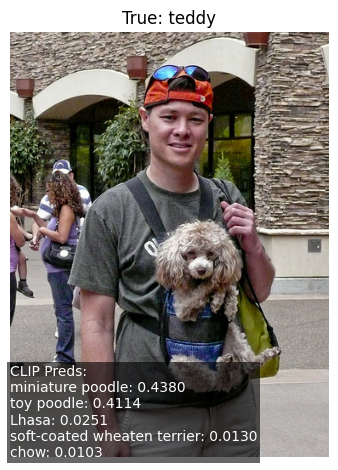

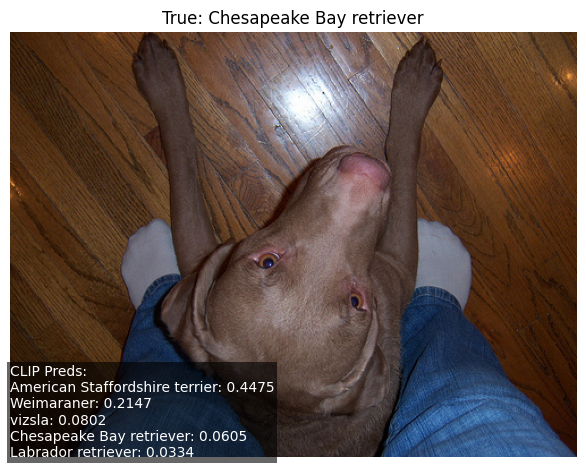

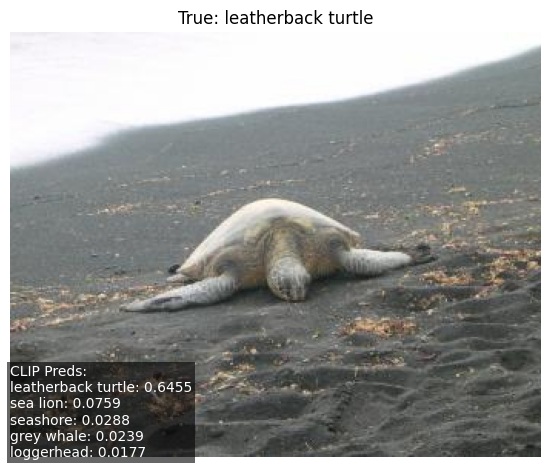

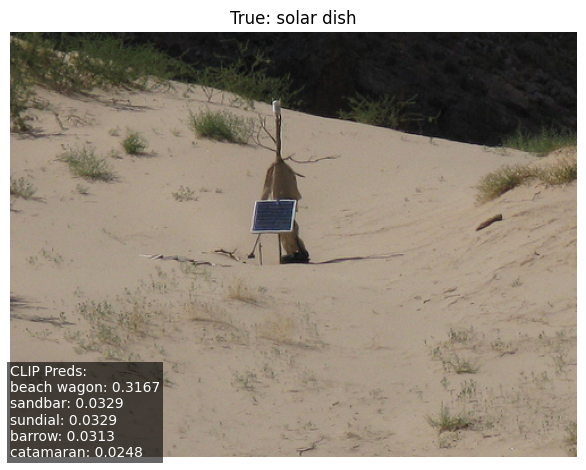

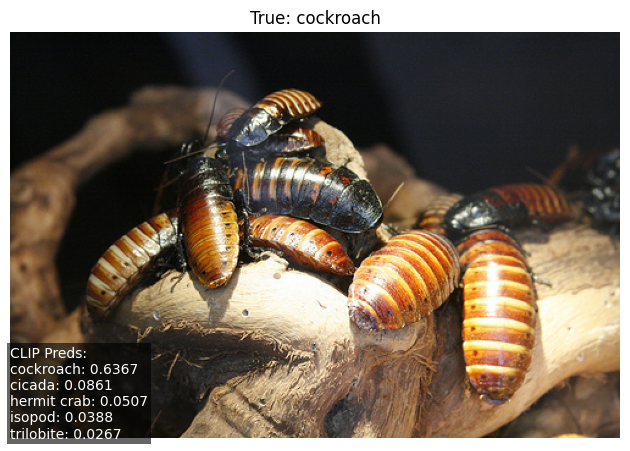

In [36]:
# show random 5 images from data/imagenet-mini/train
random_paths = np.random.choice(imagenet_train_file_paths, 5, replace=False)
for path in random_paths:
    image = Image.open(path)
    true_class = synset_data[path.split("/")[-2]]
    probs, labels = classify_with_clip(image)
    visualize_classification(image, true_class, probs, labels)
    

### ImageNet Pretraining

In [37]:
resnet_preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
imagenet_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1).to(device)
imagenet_model.eval()
def classify_with_resnet(image):
    image = resnet_preprocess(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = imagenet_model(image)
    probs = F.softmax(output[0], dim=0)

    vals, indices = torch.topk(probs, 5)
    labels = [imagenet_labels[i.item()] for i in indices]
    return vals, labels

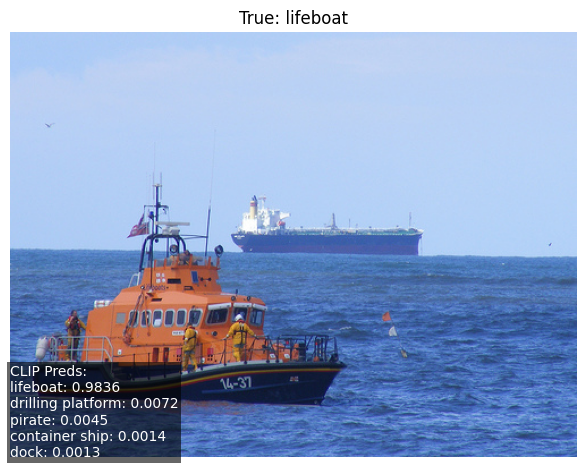

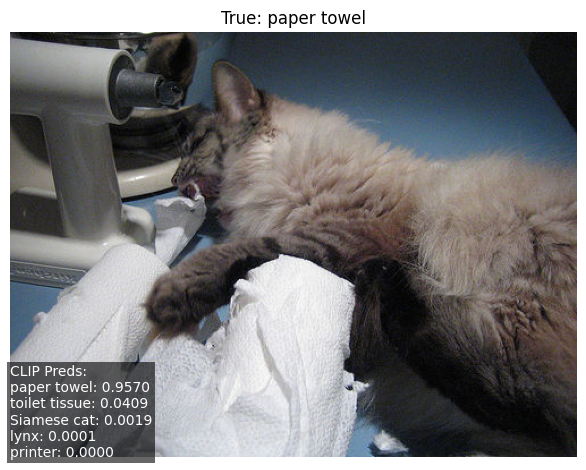

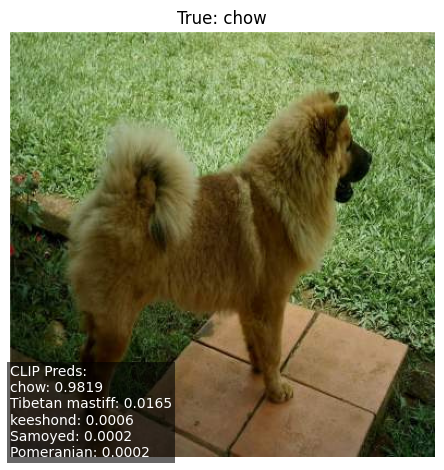

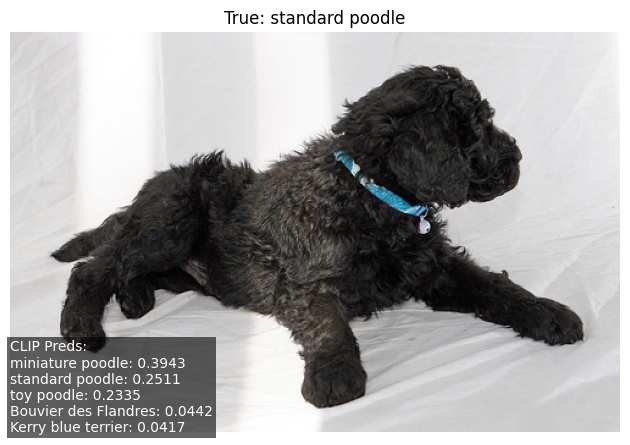

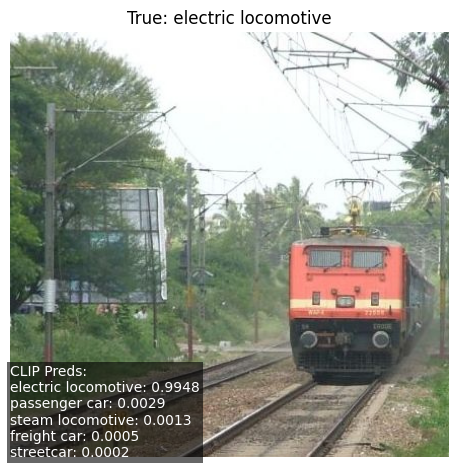

In [38]:
# show random 5 images from data/imagenet-mini/train
random_paths = np.random.choice(imagenet_train_file_paths, 5, replace=False)
for path in random_paths:
    image = Image.open(path)
    image = image.convert("RGB")
    true_class = synset_data[path.split("/")[-2]]
    probs, labels = classify_with_resnet(image)
    visualize_classification(image, true_class, probs, labels)
    

## CLIP vs ImageNet pretraining

### Works with CLIP but not with ImageNet pretraining

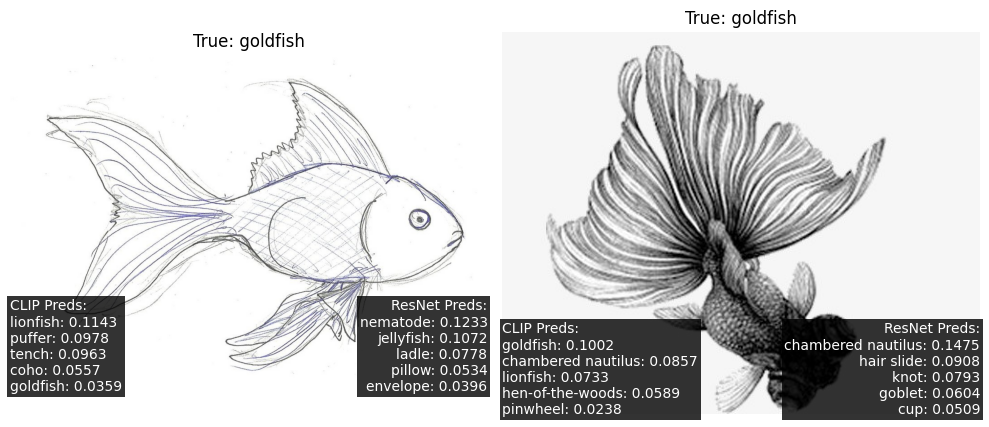

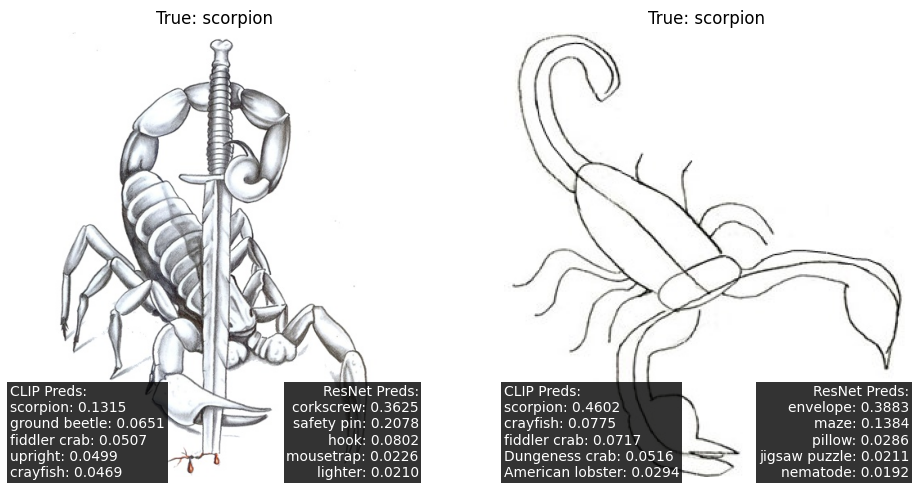

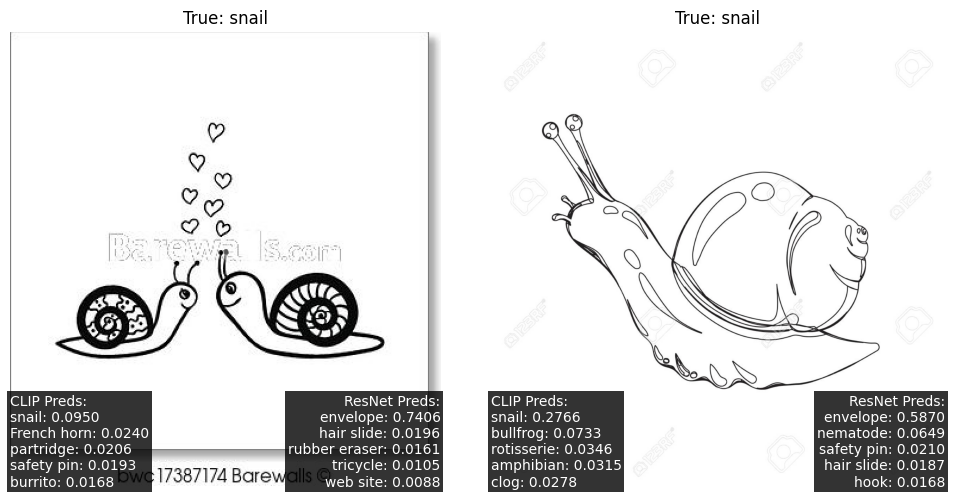

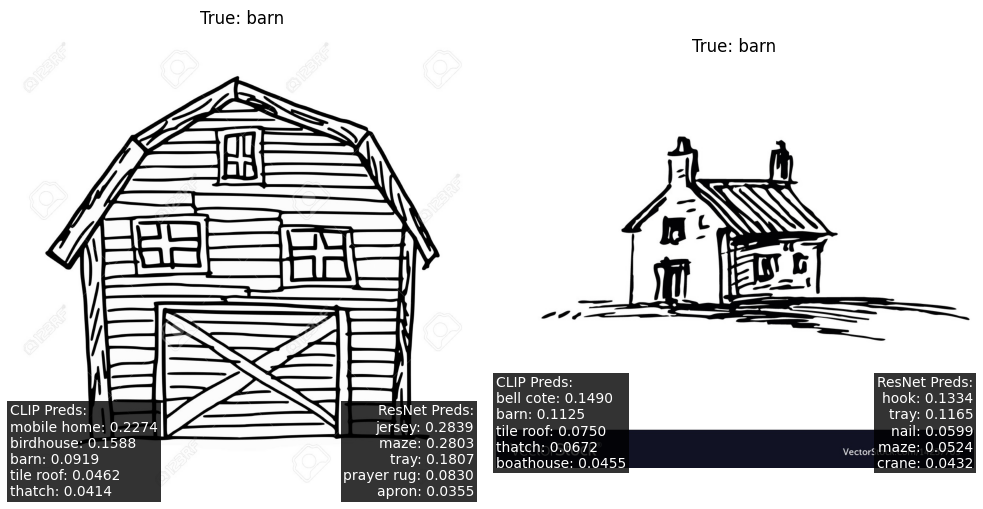

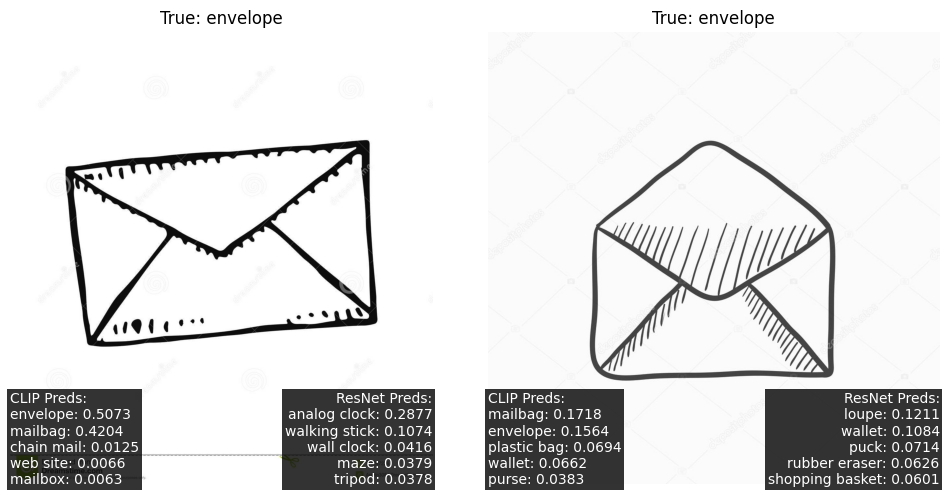

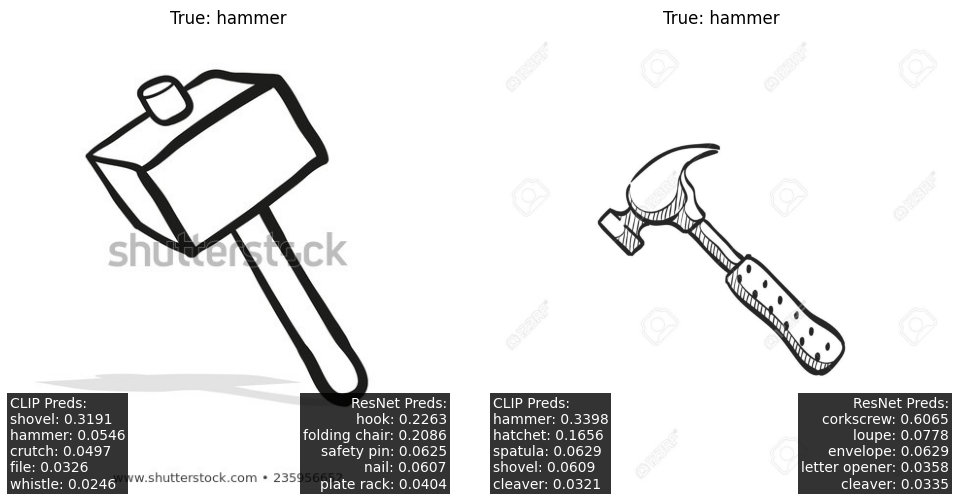

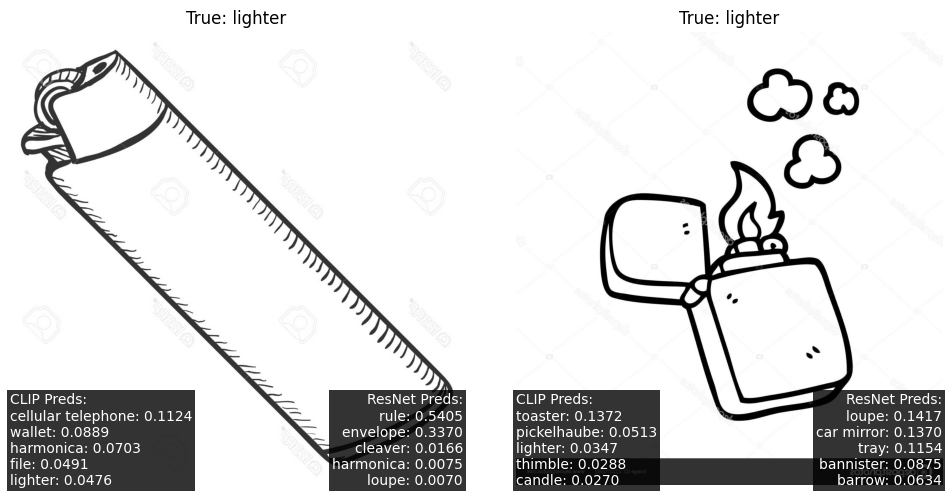

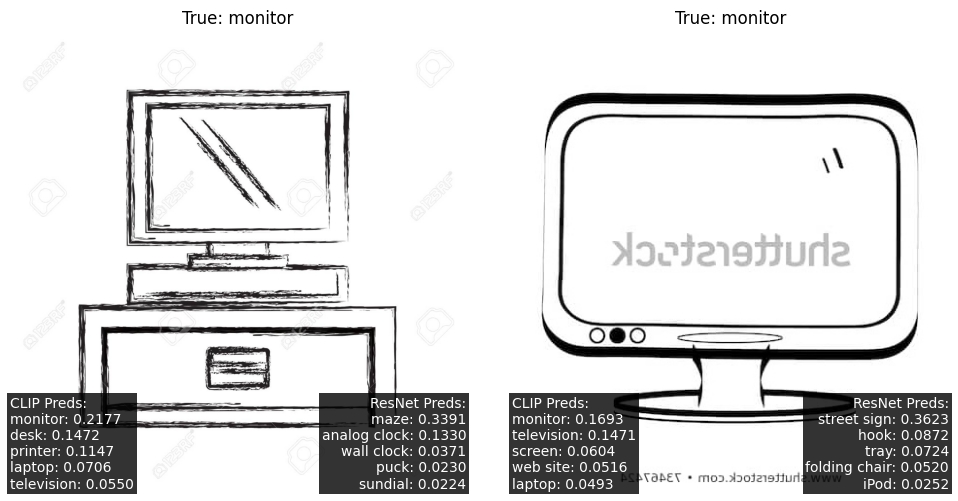

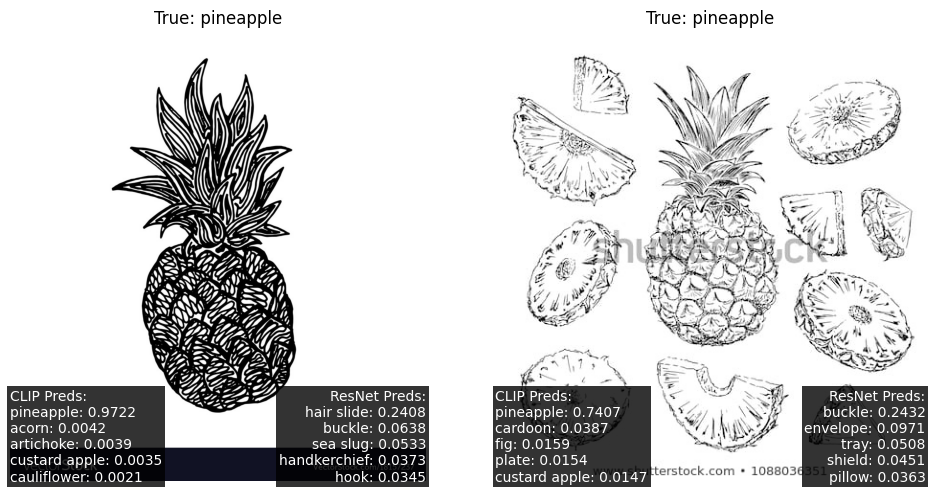

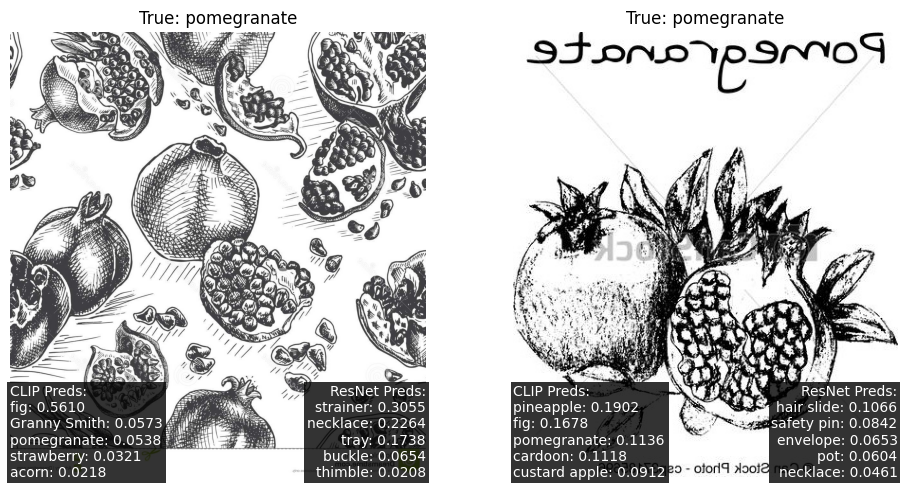

In [39]:
synset_ids = os.listdir("data/sketches")
synset_ids.sort()

for id in synset_ids:
    sketch_files = os.listdir(f"data/sketches/{id}")
    # sketch_files.sort()
    found = []
    for file in sketch_files:
        if len(found) == 2:
            break
        img = Image.open(f"data/sketches/{id}/{file}")
        img = img.convert("RGB")
        clip_probs, clip_labels = classify_with_clip(img)
        resnet_probs, resnet_labels = classify_with_resnet(img)
        true_label = synset_data[id]
        if true_label in clip_labels and true_label not in resnet_labels:
            found.append((img, true_label, clip_probs, clip_labels, resnet_probs, resnet_labels))

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    for i, (img, true_label, clip_probs, clip_labels, resnet_probs, resnet_labels) in enumerate(found):
        ax[i].imshow(img)
        ax[i].axis('off')
        ax[i].set_title("True: " + true_label)
        ax_text = "CLIP Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(clip_labels, clip_probs)])
        ax[i].text(0, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.8, edgecolor='none', pad=2), transform=ax[i].transAxes)
        ax_text = "ResNet Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(resnet_labels, resnet_probs)])
        ax[i].text(1, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.8, edgecolor='none', pad=2), transform=ax[i].transAxes, ha='right')
    plt.tight_layout()
    plt.show()

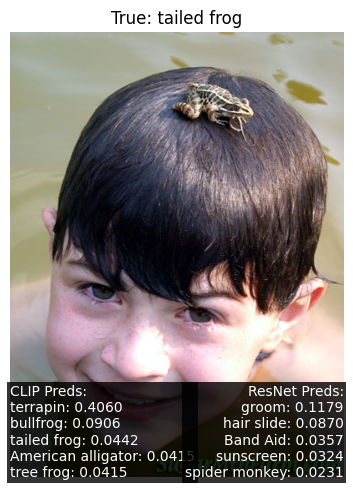

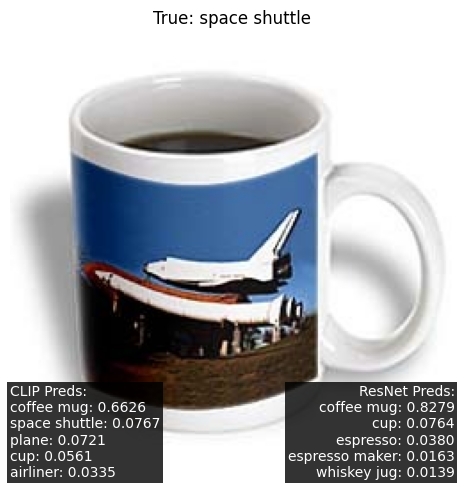

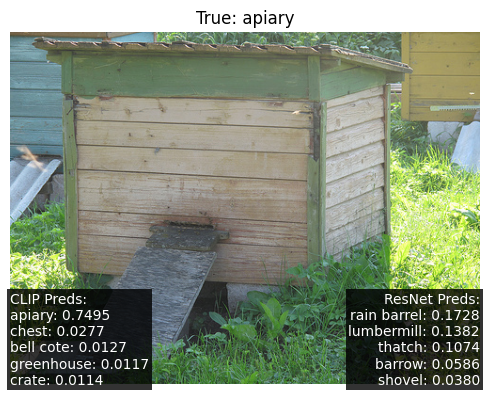

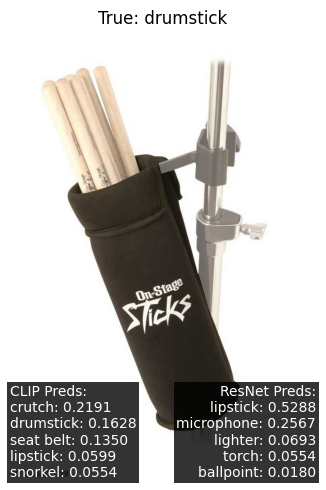

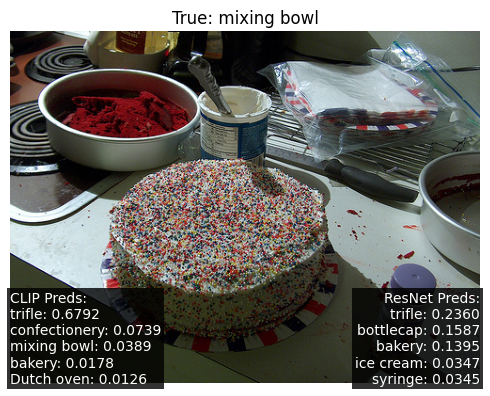

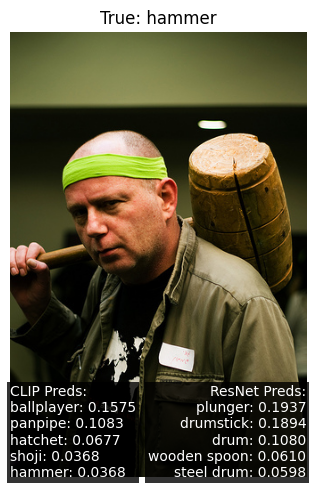

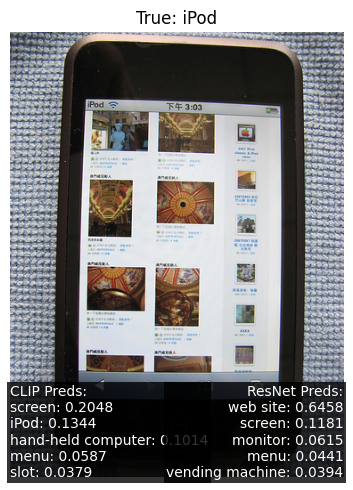

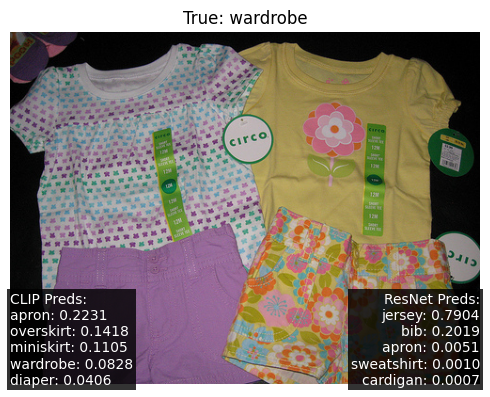

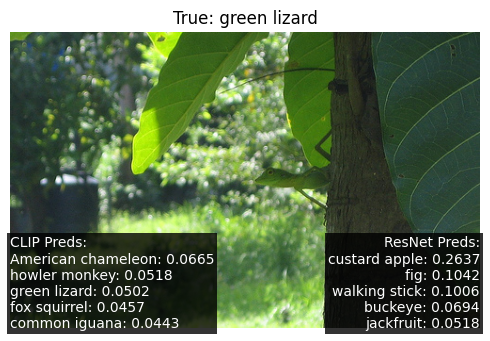

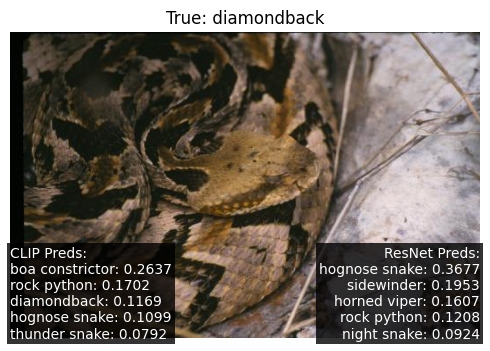

In [40]:
synset_ids = os.listdir("data/imagenet-mini/train")
total_found = 0
for id in synset_ids:
    files = os.listdir(f"data/imagenet-mini/train/{id}")
    # files.sort()
    found = []
    for file in files:
        if len(found) == 1:
            break
        img = Image.open(f"data/imagenet-mini/train/{id}/{file}")
        img = img.convert("RGB")
        clip_probs, clip_labels = classify_with_clip(img)
        resnet_probs, resnet_labels = classify_with_resnet(img)
        true_label = synset_data[id]
        if true_label in clip_labels and true_label not in resnet_labels:
            found.append((img, true_label, clip_probs, clip_labels, resnet_probs, resnet_labels))
    if len(found) != 1:
        continue
    total_found += len(found)
    if total_found > 10:
        break
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    for i, (img, true_label, clip_probs, clip_labels, resnet_probs, resnet_labels) in enumerate(found):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title("True: " + true_label)
        ax_text = "CLIP Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(clip_labels, clip_probs)])
        ax.text(0, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.8, edgecolor='none', pad=2), transform=ax.transAxes)
        ax_text = "ResNet Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(resnet_labels, resnet_probs)])
        ax.text(1, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.8, edgecolor='none', pad=2), transform=ax.transAxes, ha='right')
    plt.tight_layout()
    plt.show()

- Trained on vast, diverse image-text pairs from the internet, CLIP can handle unconventional compositions, abstract visuals, and non-standard lighting or styles.
- By learning through natural language rather than a fixed label set, CLIP grasps semantic meaning and contextual relationships beyond rigid categories.
- Its language-guided learning enables a more flexible, concept-driven understanding of visual content, making it well-suited for zero-shot tasks and out-of-distribution images.

### Works with ImageNet pretraining but not with CLIP

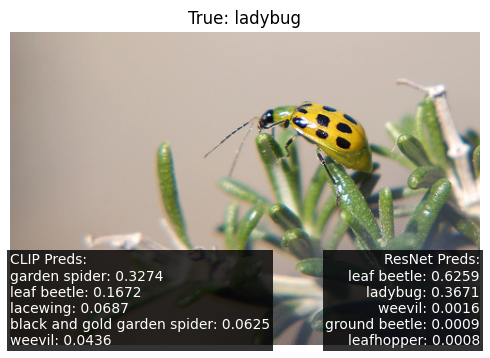

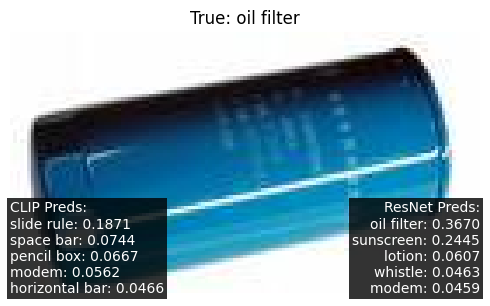

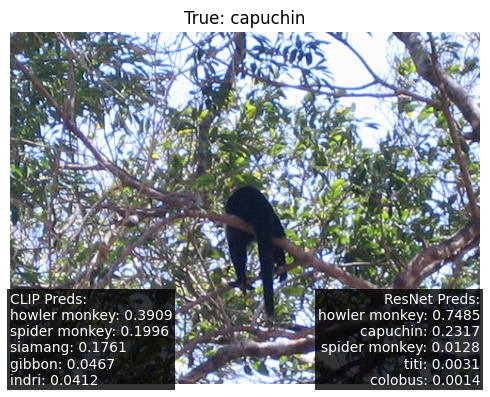

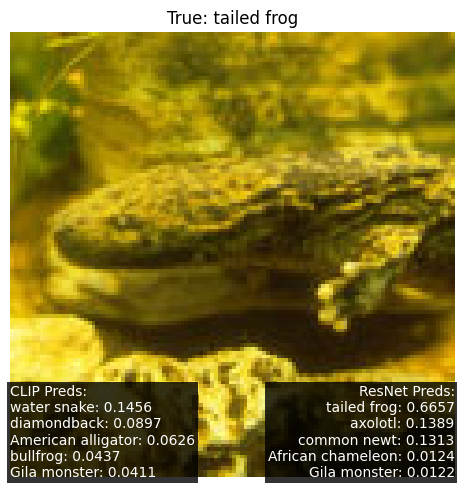

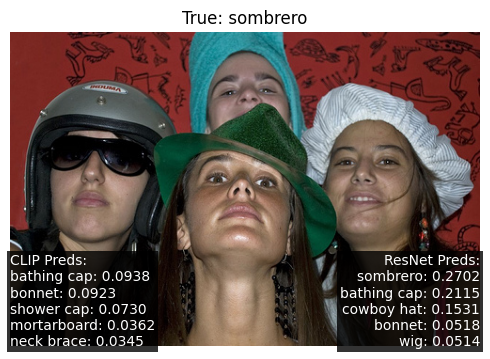

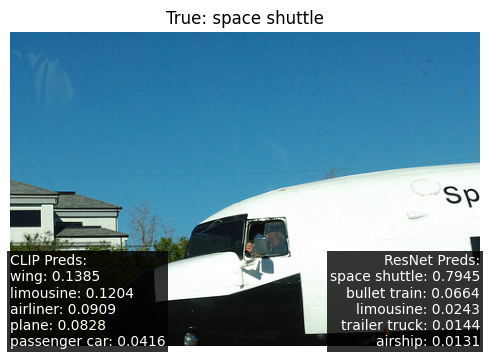

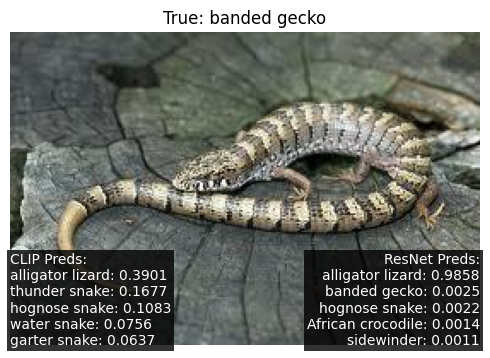

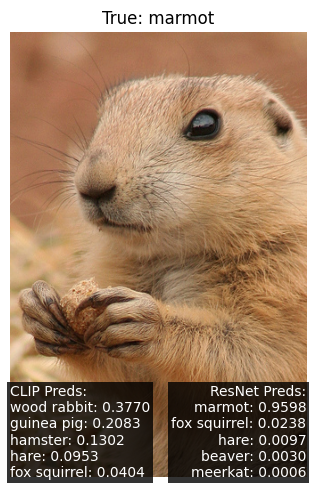

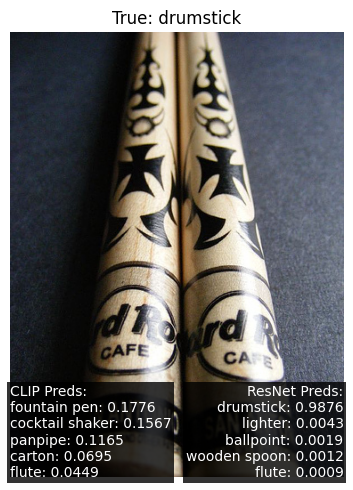

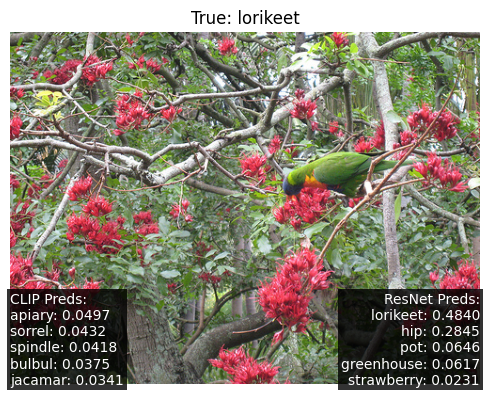

In [41]:
synset_ids = os.listdir("data/imagenet-mini/train")
total_found = 0
for id in synset_ids:
    files = os.listdir(f"data/imagenet-mini/train/{id}")
    # files.sort()
    found = []
    for file in files:
        if len(found) == 1:
            break
        img = Image.open(f"data/imagenet-mini/train/{id}/{file}")
        img = img.convert("RGB")
        clip_probs, clip_labels = classify_with_clip(img)
        resnet_probs, resnet_labels = classify_with_resnet(img)
        true_label = synset_data[id]
        if true_label in resnet_labels and true_label not in clip_labels:
            found.append((img, true_label, clip_probs, clip_labels, resnet_probs, resnet_labels))
    if len(found) != 1:
        continue
    total_found += len(found)
    if total_found > 10:
        break
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    for i, (img, true_label, clip_probs, clip_labels, resnet_probs, resnet_labels) in enumerate(found):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title("True: " + true_label)
        ax_text = "CLIP Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(clip_labels, clip_probs)])
        ax.text(0, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.8, edgecolor='none', pad=2), transform=ax.transAxes)
        ax_text = "ResNet Preds:\n" + "\n".join([f"{label}: {prob.item():.4f}" for label, prob in zip(resnet_labels, resnet_probs)])
        ax.text(1, 0, ax_text, fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.8, edgecolor='none', pad=2), transform=ax.transAxes, ha='right')
    plt.tight_layout()
    plt.show()

- Trained on a clean, labeled dataset of 1,000 specific categories, these models are highly accurate when dealing with well-defined object classes.
- Their architecture and training are tailored to pick up on subtle visual differences, allowing them to excel in fine-grained recognition within their domain.
- Because the models are exposed to consistent visual patterns—like centered objects, neutral backgrounds, and clear lighting—they perform reliably on images that share those traits.

## Quantization

In [ ]:
clip_model_fp32 = clip.load("RN50", device=device)[0].visual
clip_model_fp16 = copy.deepcopy(clip_model_fp32).half().to(device)

clip_model_fp32.eval()
clip_model_fp16.eval()

resnet_imagenet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
resnet_clip, preprocess = clip.load("RN50", device=device)
resnet_clip = resnet_clip.visual

def measure_encoding_time(model, image, runs=100):
    times = []
    for _ in range(runs):
        start_time = time.time()
        with torch.no_grad():
            image_features = model(image)
        end_time = time.time()
        times.append(end_time - start_time)
    return np.mean(times), np.std(times)

img = np.random.choice(imagenet_train_file_paths)
img = Image.open(img)
img = img.convert("RGB")
image_fp16 = preprocess(img).unsqueeze(0).to(device).half()
mean_fp32, std_fp32 = measure_encoding_time(clip_model_fp32, preprocess(img).unsqueeze(0).to(device))
mean_fp16, std_fp16 = measure_encoding_time(clip_model_fp16, image_fp16)

print(f"FP32 Encoding Time: Mean = {mean_fp32:.6f}s, Std = {std_fp32:.6f}s")
print(f"FP16 Encoding Time: Mean = {mean_fp16:.6f}s, Std = {std_fp16:.6f}s")

FP32 Encoding Time: Mean = 0.020928s, Std = 0.129316s
FP16 Encoding Time: Mean = 0.008563s, Std = 0.000357s


- Encoding time is lesser with FP16 compared to FP32, indicating that FP16 is faster for encoding images.
- The standard deviation of the encoding time is lower with FP16, indicating that the encoding time is more consistent across different runs. 

In [8]:
# sample 5 random images from train
random_paths = np.random.choice(imagenet_train_file_paths, 5, replace=False)

for path in random_paths:
    image = Image.open(path).convert("RGB")
    image_fp16 = preprocess(image).unsqueeze(0).to(device).half()
    image_fp32 = preprocess(image).unsqueeze(0).to(device)

    with torch.no_grad():
        probs_fp16 = F.softmax(clip_model_fp16(image_fp16) @ text_features.T, dim=-1)
        probs_fp32 = F.softmax(clip_model_fp32(image_fp32) @ text_features.T, dim=-1)

    top_probs_fp16, top_labels_fp16 = probs_fp16.topk(5)
    top_probs_fp32, top_labels_fp32 = probs_fp32.topk(5)

    print(f"Image: {path}")
    print("FP16 Top-5 Predictions:")
    for prob, label in zip(top_probs_fp16[0], top_labels_fp16[0]):
        print(f"{imagenet_labels[label]}: {prob.item():.4f}")
    print("FP32 Top-5 Predictions:")
    for prob, label in zip(top_probs_fp32[0], top_labels_fp32[0]):
        print(f"{imagenet_labels[label]}: {prob.item():.4f}")
    print("Difference in probabilities:", (top_probs_fp32 - top_probs_fp16).abs().mean().item())
    print("-" * 50)

Image: data/imagenet-mini/train/n03544143/n03544143_904.JPEG
FP16 Top-5 Predictions:
table lamp: 0.0011
barber chair: 0.0011
dial telephone: 0.0011
paddlewheel: 0.0011
electric fan: 0.0011
FP32 Top-5 Predictions:
table lamp: 0.0011
barber chair: 0.0011
dial telephone: 0.0011
paddlewheel: 0.0011
electric fan: 0.0011
Difference in probabilities: 3.5762786865234375e-07
--------------------------------------------------
Image: data/imagenet-mini/train/n03874293/n03874293_8383.JPEG
FP16 Top-5 Predictions:
paddlewheel: 0.0012
fireboat: 0.0012
pier: 0.0012
dock: 0.0012
boathouse: 0.0012
FP32 Top-5 Predictions:
paddlewheel: 0.0012
fireboat: 0.0012
pier: 0.0012
dock: 0.0012
boathouse: 0.0012
Difference in probabilities: 3.5762786865234375e-07
--------------------------------------------------
Image: data/imagenet-mini/train/n02361337/n02361337_478.JPEG
FP16 Top-5 Predictions:
marmot: 0.0016
fox squirrel: 0.0013
polecat: 0.0013
beaver: 0.0013
marmoset: 0.0012
FP32 Top-5 Predictions:
marmot: 0.00

The results show that there is not much significant difference in the performance of the model when using FP16 or FP32. The model is able to achieve similar accuracy and loss values with both data types.

Reason:
- Normalization layers (LayerNorm) are less sensitive to the precision of the input data compared to other layers like convolutional or fully connected layers.
- Softmax and cross-entropy loss functions are also less sensitive to the precision of the input data.

In [26]:
def get_gpu_memory_usage():
    return int(subprocess.check_output(['nvidia-smi', '--query-gpu=memory.used', '--format=csv,nounits,noheader']).split()[0])

def profile_model(model_type, model, preprocess, image_path, num_runs=1):
    torch.cuda.empty_cache()
    baseline_memory = get_gpu_memory_usage()

    image = preprocess(Image.open(image_path)).unsqueeze(0).to("cuda")
    if model_type == "FP16":
        image = image.half()

    memory_after_image = get_gpu_memory_usage()
    max_memory_usage = memory_after_image

    for run in range(num_runs):
        with torch.no_grad():
            _ = model.encode_image(image)
            torch.cuda.synchronize()

        current_memory = get_gpu_memory_usage()
        max_memory_usage = max(max_memory_usage, current_memory)

    memory_increase = max_memory_usage - memory_after_image
    torch_allocated = torch.cuda.memory_allocated() / (1024 * 1024) 
    torch_reserved = torch.cuda.memory_reserved() / (1024 * 1024) 

    return {
        "max_memory_increase": max_memory_usage - baseline_memory,
        "nvidia_smi_increase": memory_increase,
        "torch_allocated": torch_allocated,
        "torch_reserved": torch_reserved
    }
    
model_fp32, preprocess = clip.load("RN50", device="cuda")
image_path = random_paths[0]
fp32_results = profile_model("FP32", model_fp32, preprocess, image_path)
del model_fp32
torch.cuda.empty_cache()
time.sleep(3)
model_fp16, _ = clip.load("RN50", device="cuda")
model_fp16 = model_fp16.half()
fp16_results = profile_model("FP16", model_fp16, preprocess, image_path)


print("FP32 Results:")
print(f"Max Memory Increase (nvidia-smi): {fp32_results['max_memory_increase']} MB")
print(f"PyTorch Allocated Memory: {fp32_results['torch_allocated']:.2f} MB")
print(f"PyTorch Reserved Memory: {fp32_results['torch_reserved']:.2f} MB")
print("\nFP16 Results:")
print(f"Max Memory Increase (nvidia-smi): {fp16_results['max_memory_increase']} MB")
print(f"PyTorch Allocated Memory: {fp16_results['torch_allocated']:.2f} MB")
print(f"PyTorch Reserved Memory: {fp16_results['torch_reserved']:.2f} MB")
print("\nComparison:")
print(f"Memory Savings (nvidia-smi): {fp32_results['max_memory_increase'] - fp16_results['max_memory_increase']} MB")
print(f"Memory Savings (PyTorch Allocated): {fp32_results['torch_allocated'] - fp16_results['torch_allocated']} MB")
print(f"Memory Savings (PyTorch Reserved): {fp32_results['torch_reserved'] - fp16_results['torch_reserved']} MB")

FP32 Results:
Max Memory Increase (nvidia-smi): 6 MB
PyTorch Allocated Memory: 772.71 MB
PyTorch Reserved Memory: 796.00 MB

FP16 Results:
Max Memory Increase (nvidia-smi): 0 MB
PyTorch Allocated Memory: 526.57 MB
PyTorch Reserved Memory: 682.00 MB

Comparison:
Memory Savings (nvidia-smi): 6 MB
Memory Savings (PyTorch Allocated): 246.13671875 MB
Memory Savings (PyTorch Reserved): 114.0 MB
